# Crossview - Autoencoder

***Notes:***
- [keras implementation 2024](https://www.analyticsvidhya.com/blog/2023/07/mnist-image-reconstruction-using-an-autoencoder/)
- [reference decoder](https://github.com/ugo-nama-kun/conv_ae/blob/main/ae.py)


## Introduction

***TO DO's:***
- ensure that the bottleneck is reached in a smooth way
- loss function -> do MAE and MAE + Perceptual

using device: cuda


Using cache found in /home/lrusso/.cache/torch/hub/facebookresearch_dinov2_main


Encoder(
  (vit): _LinearClassifierWrapper(
    (backbone): DinoVisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
        (norm): Identity()
      )
      (blocks): ModuleList(
        (0-11): 12 x NestedTensorBlock(
          (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
          (attn): MemEffAttention(
            (qkv): Linear(in_features=384, out_features=1152, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=384, out_features=384, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=384, out_features=1536, bias=True)
            (act): GELU(approximate='none')
            (fc2): Linear(in_features=1536, out_features=3

Epoch 1/10: 100%|██████████| 135/135 [02:15<00:00,  1.00s/it]


Epoch 1/10: Train Loss = 0.0040
Epoch 1: Validation Loss = 0.0010


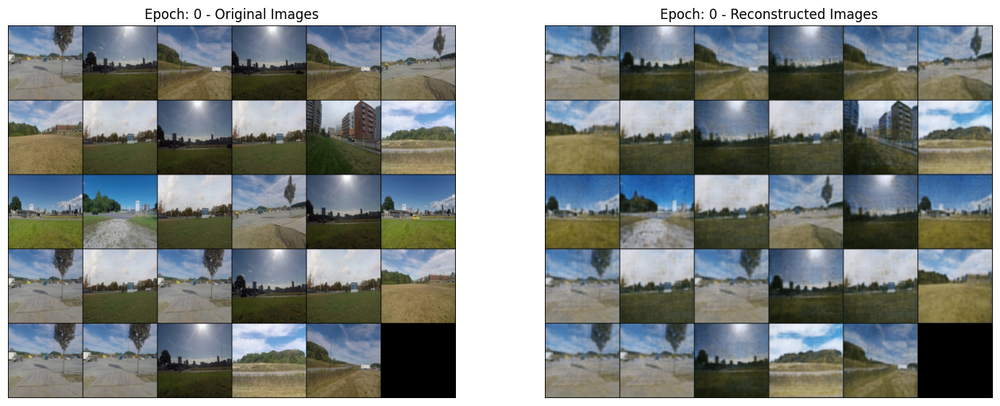

Epoch 2/10: 100%|██████████| 135/135 [02:14<00:00,  1.01it/s]


Epoch 2/10: Train Loss = 0.0010
Epoch 2: Validation Loss = 0.0007


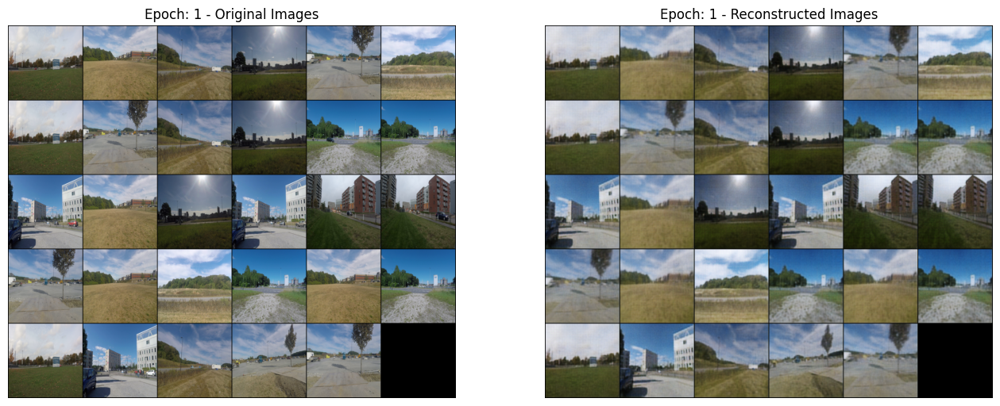

Epoch 3/10: 100%|██████████| 135/135 [02:06<00:00,  1.07it/s]


Epoch 3/10: Train Loss = 0.0007
Epoch 3: Validation Loss = 0.0005


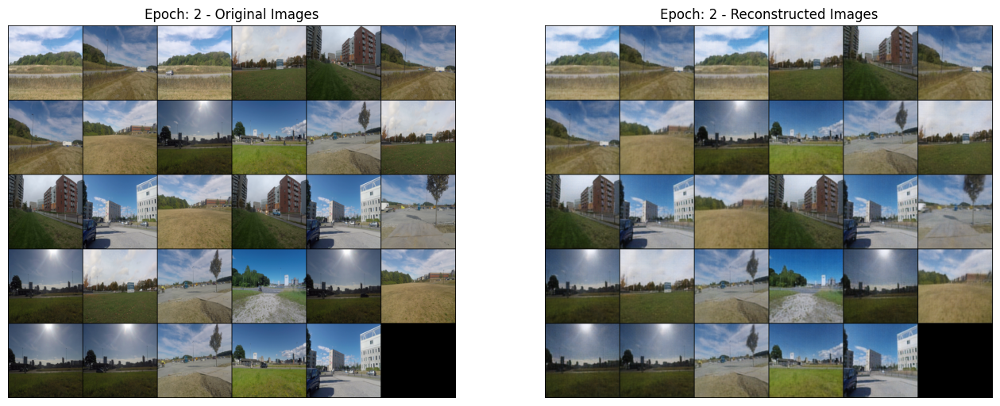

Epoch 4/10: 100%|██████████| 135/135 [02:05<00:00,  1.08it/s]


Epoch 4/10: Train Loss = 0.0006
Epoch 4: Validation Loss = 0.0005


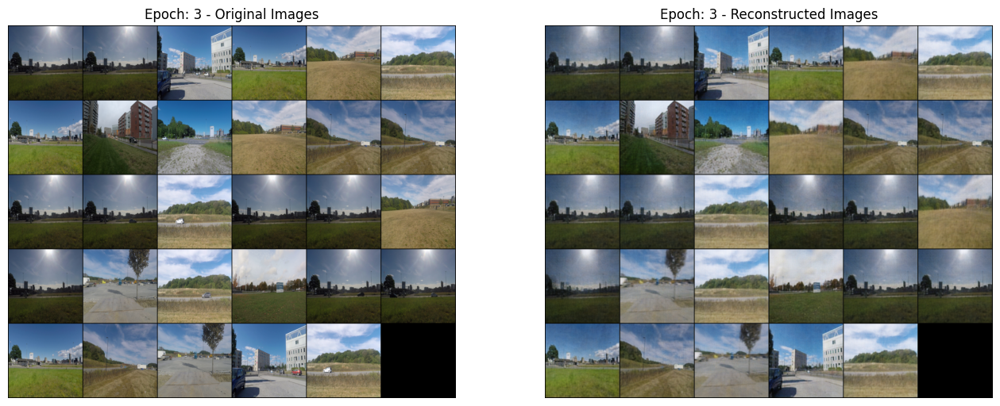

Epoch 5/10: 100%|██████████| 135/135 [02:07<00:00,  1.06it/s]


Epoch 5/10: Train Loss = 0.0005
Epoch 5: Validation Loss = 0.0004


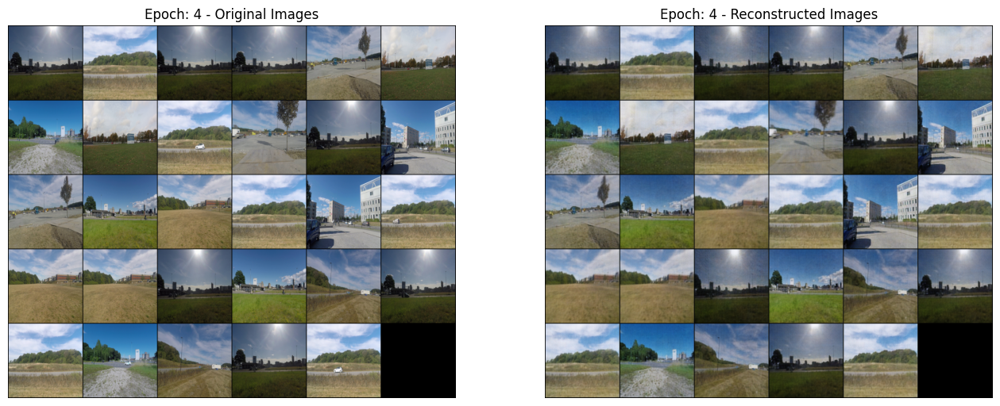

Epoch 6/10: 100%|██████████| 135/135 [02:05<00:00,  1.08it/s]


Epoch 6/10: Train Loss = 0.0005
Epoch 6: Validation Loss = 0.0004


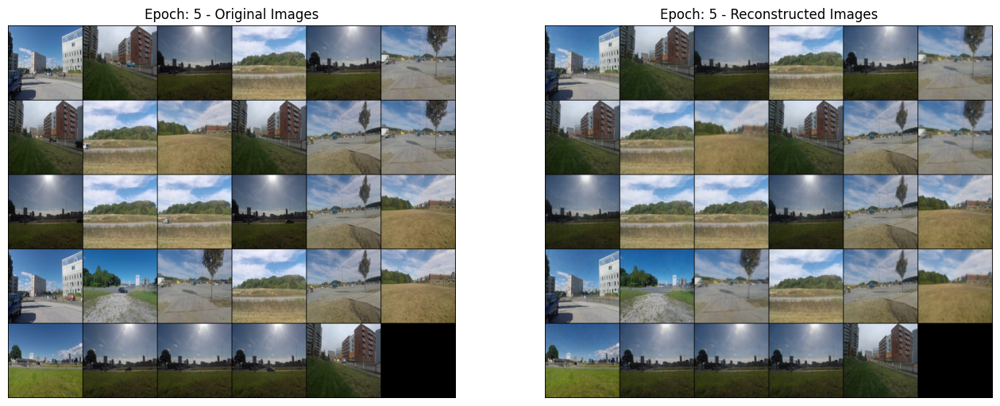

Epoch 7/10: 100%|██████████| 135/135 [02:04<00:00,  1.08it/s]


Epoch 7/10: Train Loss = 0.0004
Epoch 7: Validation Loss = 0.0003


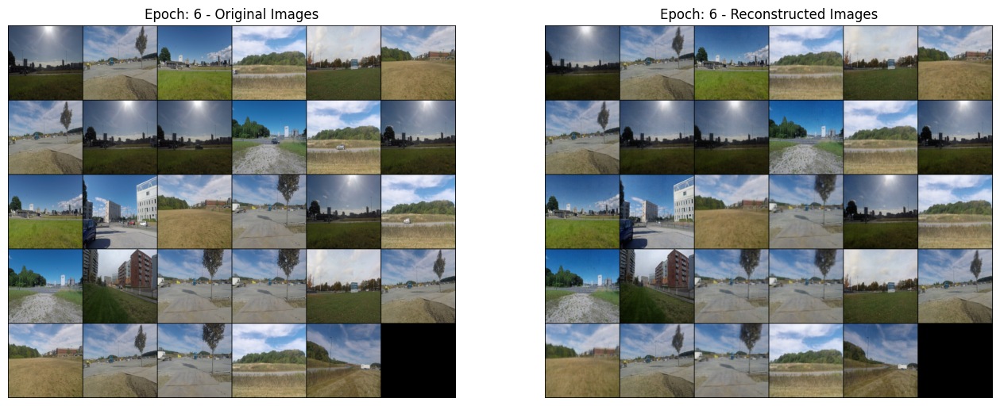

Epoch 8/10: 100%|██████████| 135/135 [02:05<00:00,  1.07it/s]


Epoch 8/10: Train Loss = 0.0004
Epoch 8: Validation Loss = 0.0004


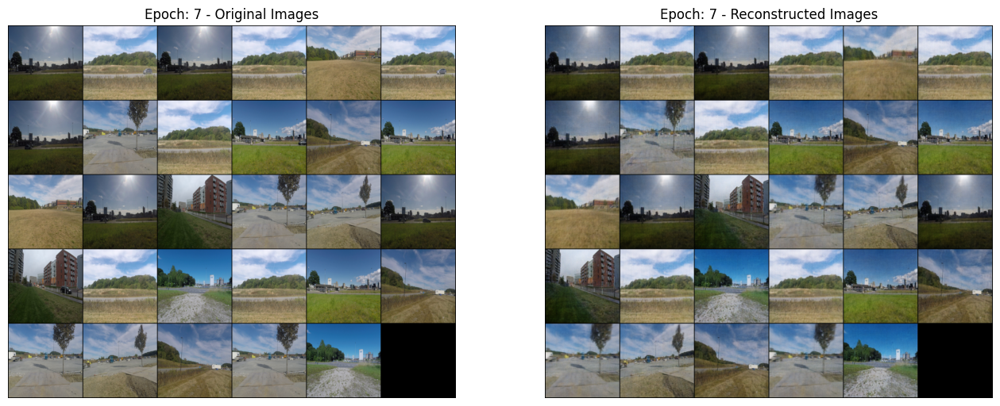

Epoch 9/10: 100%|██████████| 135/135 [02:05<00:00,  1.07it/s]


Epoch 9/10: Train Loss = 0.0004
Epoch 9: Validation Loss = 0.0003


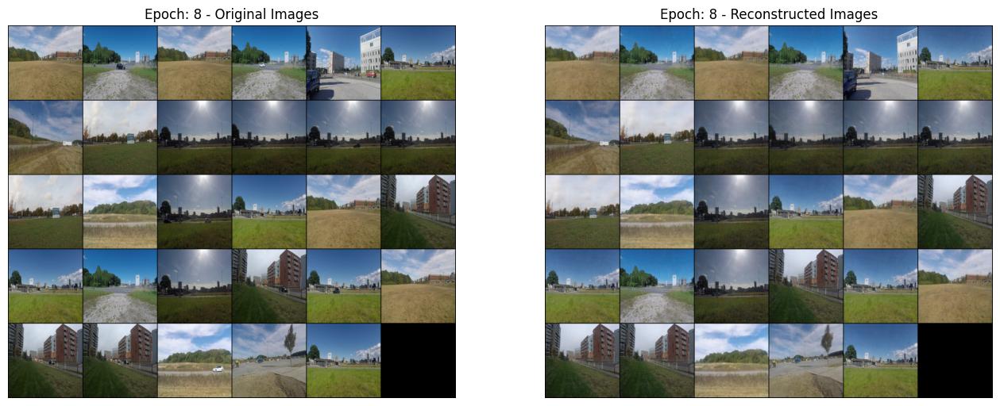

Epoch 10/10: 100%|██████████| 135/135 [02:05<00:00,  1.07it/s]


Epoch 10/10: Train Loss = 0.0004
Epoch 10: Validation Loss = 0.0003


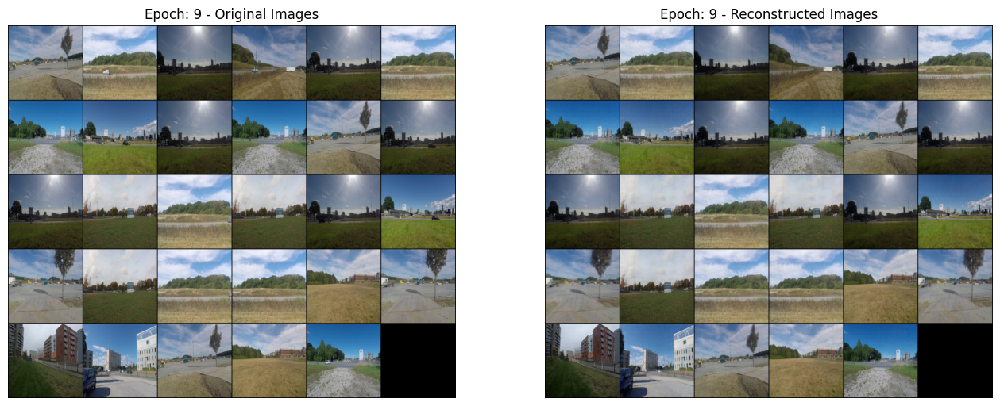

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from tqdm import tqdm
from torchvision.transforms.functional import to_tensor, to_pil_image
import matplotlib.pyplot as plt
import shutil
import timm
from utils import *


# Set the device
!export CUDA_VISIBLE_DEVICES=0


class Encoder(nn.Module):
    def __init__(self, out_features=100):
        super(Encoder, self).__init__()
        
        # # Load the ViT from timm
        # self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)

        # Load the DINOv2 from Facebook Research
        self.vit = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14_reg_lc')

        for param in self.vit.parameters():
            param.requires_grad = False         # freeze all parameters of the Vision Transformer

        # # Retrive the number of features in the last layer of the ViT
        # linear_features = self.vit.num_features    # get the number of features in the model
        
        # Retrieve the number of features in the last layer of DINOv2
        linear_features = self.vit.linear_head.in_features

        # # Remove the classifier head from the ViT
        # self.vit.head = nn.Identity()
                
        # Remove the classifier head from DINOv2
        self.vit.linear_head = nn.Identity()

        self.reducer = nn.Sequential(
            nn.Linear(linear_features, (linear_features + out_features) // 2),      # floored average between input and output features
            nn.ELU(True),
            nn.Linear((linear_features + out_features) // 2, out_features)
        )

    def forward(self, x):
        x = self.vit(x)
        x = self.reducer(x)     # reduce the feature to (out_features x 1)
        return x
   

class Decoder(nn.Module):
    def __init__(self, input_dims=100, hidden_dims=512, output_channels=3, initial_size=7):
        super(Decoder, self).__init__()

        self.input_dims = input_dims
        self.hidden_dims = hidden_dims
        self.output_channels = output_channels
        self.initial_size = initial_size
        
        self.fc = nn.Sequential(
			nn.Linear(input_dims, hidden_dims // 4),
			nn.BatchNorm1d(hidden_dims // 4),
			nn.ELU(True),
			nn.Linear(hidden_dims // 4, hidden_dims * initial_size * initial_size),
			nn.BatchNorm1d(hidden_dims * initial_size * initial_size),
			nn.ELU(True)
		)

        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(hidden_dims, initial_size, initial_size))
        
        self.upsample = nn.Sequential(
            nn.ConvTranspose2d(hidden_dims, hidden_dims // 2, kernel_size=3, stride=2, padding=1, output_padding=1),            # 7x7 -> 14x14
            nn.BatchNorm2d(hidden_dims // 2),
			nn.ELU(True),
            nn.ConvTranspose2d(hidden_dims // 2, hidden_dims // 4, kernel_size=3, stride=2, padding=1, output_padding=1),       # 14x14 -> 28x28
            nn.BatchNorm2d(hidden_dims // 4),
			nn.ELU(True),
            nn.ConvTranspose2d(hidden_dims // 4, hidden_dims // 8, kernel_size=3, stride=2, padding=1, output_padding=1),       # 28x28 -> 56x56
            nn.BatchNorm2d(hidden_dims // 8),
			nn.ELU(True),
            nn.ConvTranspose2d(hidden_dims // 8, hidden_dims // 16, kernel_size=3, stride=2, padding=1, output_padding=1),      # 56x56 -> 112x112
            nn.BatchNorm2d(hidden_dims // 16),
			nn.ELU(True),
            nn.ConvTranspose2d(hidden_dims // 16, output_channels, kernel_size=3, stride=2, padding=1, output_padding=1),       # 112x112 -> 224x224
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.fc(x)
        x = self.unflatten(x)
        x = self.upsample(x)
        return x
    
    
class CustomDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.image_paths = [os.path.join(directory, fname) for fname in os.listdir(directory) if fname.endswith('.PNG')]    # lists all PNG files in the directory

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')  # Convert image to RGB
        
        if self.transform:
            image = self.transform(image)
        
        return image


# ----- Setup ----- #

image_channels = 3          # for RGB images
image_size = 224            # assuming square images
hidden_dims = 512           # hidden dimensions
output_dims = 100          # size of phi
batch_size = 64
shuffle = True

# Select device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"using device: {device}")

# Initialize the encoder and decoder
encoder = Encoder(out_features=output_dims).to(device)
decoder = Decoder(input_dims=output_dims, hidden_dims=hidden_dims, output_channels=3, initial_size=7).to(device)
encoder.to(device)
decoder.to(device)
print(encoder, decoder)

# Optimizer and Loss Function
learning_rate = 1e-3
optimizer = optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=learning_rate)
perceptual_loss = PerceptualLoss().to(device)
criterion = nn.HuberLoss()
# criterion = nn.MSELoss()
# criterion = perceptual_loss

# Transformations
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.CenterCrop((image_size, image_size)),
    transforms.ToTensor()
])

# Define the Datasets
train_dataset = CustomDataset('dataset/labelled/train/ground', transform=transform)
val_dataset = CustomDataset('dataset/labelled/val/ground', transform=transform)

# Define the DataLoaders
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=shuffle, num_workers=4)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=shuffle)


# ----- Training ----- #

def train(encoder, decoder, train_loader, val_loader, device, criterion, optimizer, epochs=10, save_path='models'):

    encoder.to(device)
    decoder.to(device)

    os.makedirs(save_path, exist_ok=True)

    for epoch in range(epochs):

        encoder.train()
        decoder.train()

        running_loss = 0.0

        for images in tqdm(train_loader, desc=f'Epoch {epoch+1}/{epochs}'):

            images = images.to(device)

            optimizer.zero_grad()

            encoded_imgs = encoder(images)
            decoded_imgs = decoder(encoded_imgs)

            loss = criterion(decoded_imgs, images)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()


        avg_loss = running_loss / len(train_loader)

        # Log at the end of the epoch
        print(f'Epoch {epoch+1}/{epochs}: Train Loss = {avg_loss:.4f}')
        
        # Perform Validation
        validate(encoder, decoder, val_loader, criterion, device, epoch, epochs)
        visualize_reconstruction(images, decoded_imgs, epoch)

        # Save the Model
        torch.save(encoder.state_dict(), os.path.join(save_path, f'encoder_epoch_{epoch+1}.pth'))
        torch.save(decoder.state_dict(), os.path.join(save_path, f'decoder_epoch_{epoch+1}.pth'))


def validate(encoder, decoder, loader, criterion, device, epoch, epochs):
    encoder.eval()
    decoder.eval()

    with torch.no_grad():
        validation_loss = 0.0
        for images in loader:
            images = images.to(device)
            encoded_imgs = encoder(images)
            decoded_imgs = decoder(encoded_imgs)
            loss = criterion(decoded_imgs, images)
            validation_loss += loss.item()

        avg_val_loss = validation_loss / len(loader)
        print(f'Epoch {epoch+1}/{epochs}: Validation Loss = {avg_val_loss:.4f}')


train(encoder, decoder, train_dataloader, val_dataloader, device, criterion, optimizer, epochs=10, save_path='models')



In [5]:
# ----- Inference ----- #

def inference(input_dir, output_dir):

    output_dir = os.path.join('inference', output_dir)
    
    if not os.path.exists(output_dir):      # create the output directory if it doesn't exist
        os.makedirs(output_dir)
    
    image_paths = [os.path.join(input_dir, fname) for fname in os.listdir(input_dir) if fname.endswith('.PNG')]     # lists all PNG files in the directory
    
    for image_path in tqdm(image_paths, desc="Performing Inference"):
        
        image = Image.open(image_path).convert('RGB')       # load and transform the image
        image = transform(image).unsqueeze(0).to(device)
        
        # Perform inference
        with torch.no_grad():
            phi = encoder(image)
            recon_image = decoder(phi)
        
        # Convert tensors to PIL images for saving
        original_image = to_pil_image(denormalize(image.squeeze().cpu()))
        reconstructed_image = to_pil_image(denormalize(recon_image.squeeze().cpu()))
        
        # Extract filename and prepare output paths
        filename = os.path.basename(image_path)
        original_image_path = os.path.join(output_dir, f"original_{filename}")
        reconstructed_image_path = os.path.join(output_dir, f"reconstructed_{filename}")

        print("Original Image Stats:")
        print(f"Min: {image.min().item()}")
        print(f"Max: {image.max().item()}")
        print(f"Mean: {image.mean().item()}")

        print("Reconstructed Image Stats:")
        print(f"Min: {recon_image.min().item()}")
        print(f"Max: {recon_image.max().item()}")
        print(f"Mean: {recon_image.mean().item()}")
        
        # Save images
        original_image.save(original_image_path)
        reconstructed_image.save(reconstructed_image_path)


encoder.eval()
decoder.eval()


# Specify the input directory and the output directory
input_dir = 'test'  # Update as needed
output_dir = 'inference'  # The folder where original and result images will be saved

# Perform inference and save results
inference(input_dir, output_dir)

Performing Inference:   0%|          | 0/4 [00:00<?, ?it/s]


NameError: name 'denormalize' is not defined

### Visualize Transformations

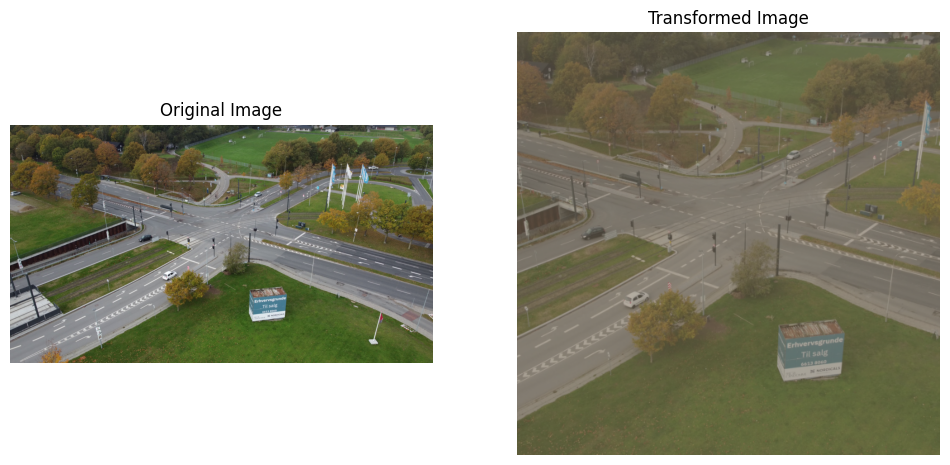

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision import transforms

image_size = 512        # assuming square images

# Transformations
transform = transforms.Compose([
    transforms.Resize(image_size),  # Resize the shortest edge to image_size
    transforms.CenterCrop((image_size, image_size)),  # Crop the center square of the image
    transforms.ToTensor(),  # Convert images to Torch tensors
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize images
])


# Load Sample Image
image_path = 'dataset/labelled/train/aerial/scene_1_Cortex_Park_crossroads_drone_000000.PNG'  # Update this to the path of your image
image = Image.open(image_path).convert('RGB')

# Apply the transformation
transformed_image = transform(image)

# Denormalize the transformed image
denormalized_transformed_image = denormalize(transformed_image.squeeze())

# Convert denormalized image back to PIL for displaying
denormalized_transformed_image_pil = to_pil_image(denormalized_transformed_image)

# Display the original and denormalized transformed images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[0].axis('off')

axs[1].imshow(denormalized_transformed_image_pil)
axs[1].set_title('Transformed Image')
axs[1].axis('off')

plt.show()


## Training

## Validation

## Inference

In [ ]:
# from torchvision.transforms.functional import to_tensor, to_pil_image
# import matplotlib.pyplot as plt


# # Initialize the models
# encoder = Encoder(image_channels, hidden_dims, output_dims).to(device)
# decoder = Decoder(output_dims, hidden_dims, image_channels, image_size).to(device)

# # Load the saved model weights
# encoder.load_state_dict(torch.load('encoder_model.pth', map_location=device))
# decoder.load_state_dict(torch.load('decoder_model.pth', map_location=device))

# # Set the models to evaluation mode
# encoder.eval()
# decoder.eval()


# def preprocess_image(image_path):
#     image = Image.open(image_path).convert('RGB')
#     image = transforms.Resize((64, 64))(image)  # Resize to the same size as during training
#     image = to_tensor(image)  # Convert to tensor
#     image = transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])(image)  # Normalize
#     return image.unsqueeze(0).to(device)  # Add batch dimension and send to device


# def infer_and_plot(image_path):
#     # Preprocess the image
#     image = preprocess_image(image_path)
    
#     # Perform inference
#     with torch.no_grad():
#         phi = encoder(image)
#         recon_image = decoder(phi)
    
#     # Convert images to PIL for visualization
#     image = to_pil_image(image.squeeze().cpu())
#     recon_image = to_pil_image(recon_image.squeeze().cpu())
    
#     # Plotting
#     fig, ax = plt.subplots(1, 2, figsize=(12, 6))
#     ax[0].imshow(image)
#     ax[0].set_title('Original Image')
#     ax[0].axis('off')
    
#     ax[1].imshow(recon_image)
#     ax[1].set_title('Reconstructed Image')
#     ax[1].axis('off')
    
#     plt.show()

# # Example usage
# image_path = 'dataset/labelled/val/aerial/scene_1_Cortex_Park_crossroads_drone_000017.PNG'
# infer_and_plot(image_path)
